# Reconstruct Image Using Singular-Value Decomposition Approach 

In [1]:
import os
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import astropy.io.fits as fits, time

%load_ext autoreload
%autoreload 2

### Load Primary Beam Model

In [84]:
#
def loadbeam(path, antnum=1):
    
    XX_re = fits.open('%s' %os.path.join(path, 'ant%iGxRe.fits' %antnum))[0].data
    XX_im = fits.open('%s' %os.path.join(path, 'ant%iGxIm.fits' %antnum))[0].data
    XY_re = fits.open('%s' %os.path.join(path, 'ant%iGyRe.fits' %antnum))[0].data
    XY_im = fits.open('%s' %os.path.join(path, 'ant%iGyIm.fits' %antnum))[0].data
    YX_re = fits.open('%s' %os.path.join(path, 'ant%iDxRe.fits' %antnum))[0].data
    YX_im = fits.open('%s' %os.path.join(path, 'ant%iDxIm.fits' %antnum))[0].data
    YY_re = fits.open('%s' %os.path.join(path, 'ant%iDyRe.fits' %antnum))[0].data
    YY_im = fits.open('%s' %os.path.join(path, 'ant%iDyIm.fits' %antnum))[0].data
    
    emap = []
    emap.append([XX_re + 1j*XX_im, XY_re + 1j*XY_im])  
    emap.append([YX_re + 1j*YX_im, YY_re + 1j*YY_im])
    
    s = np.array(emap)  

    s = np.swapaxes(s, axis1=2, axis2=0)    
    
    return  s 

path = '/home/tan/Documents/GSSTI/holog'

gdata = loadbeam(path, antnum=6)
#

In [85]:
gdata.shape

(20, 2, 2, 256, 256)

In [87]:
gdata[10, 0,0,...]

array([[0.01125886+0.02413166j, 0.01099108+0.02411255j,
        0.01073492+0.02408027j, ..., 0.01228412+0.0199344j ,
        0.01250445+0.01989329j, 0.01275642+0.01987845j],
       [0.01059109+0.02418092j, 0.01031519+0.02417103j,
        0.01005257+0.02414607j, ..., 0.0119052 +0.02044097j,
        0.01211483+0.02038803j, 0.01233169+0.02034229j],
       [0.00988815+0.02427006j, 0.00960424+0.02426925j,
        0.00933216+0.02425503j, ..., 0.01149977+0.02092248j,
        0.01169649+0.02085547j, 0.01188809+0.02078731j],
       ...,
       [0.01463649+0.01972202j, 0.0144885 +0.01990714j,
        0.01424434+0.02000467j, ..., 0.01138022+0.01333242j,
        0.01147612+0.01387556j, 0.01159812+0.01439801j],
       [0.01505886+0.01957339j, 0.01497732+0.01980404j,
        0.01488472+0.02000637j, ..., 0.0119423 +0.01337731j,
        0.0119972 +0.01387293j, 0.01208832+0.01436817j],
       [0.01539845+0.01941097j, 0.01532814+0.0196408j ,
        0.01525953+0.01984006j, ..., 0.01248788+0.01350147j,
 

(array([-50.,   0.,  50., 100., 150., 200., 250., 300.]),
 <a list of 8 Text yticklabel objects>)

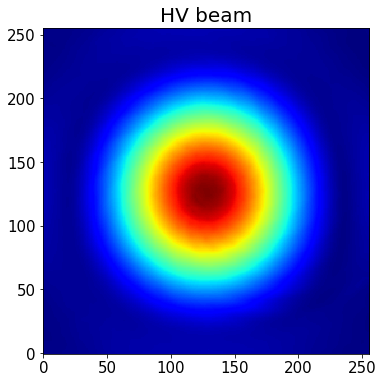

In [6]:
plt.figure(1, figsize=(6,6));
plt.imshow(abs(gdata[10, 1,0,...]), origin='lower', cmap='jet')
plt.title(r'HV beam', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

(array([-50.,   0.,  50., 100., 150., 200., 250., 300.]),
 <a list of 8 Text yticklabel objects>)

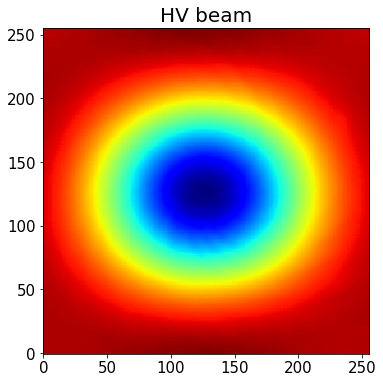

In [91]:
plt.figure(1, figsize=(6,6));
plt.imshow((gdata[10, 0,0,...].imag), origin='lower', cmap='jet')
plt.title(r'HV beam', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

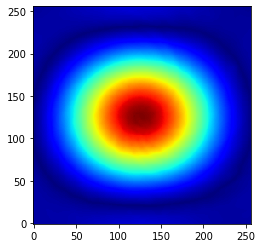

In [92]:
plt.imshow(abs(gdata[10, 0,0,...].imag), origin='lower', cmap='jet')

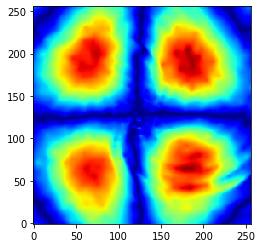

In [93]:
plt.imshow(abs(gdata[10, 0,1,...].imag), origin='lower', cmap='jet')

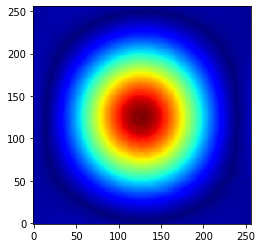

In [98]:
plt.imshow(abs(gdata[10, 1,0,...].imag), origin='lower', cmap='jet')

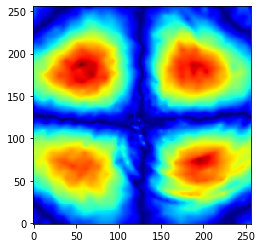

In [97]:
plt.imshow(abs(gdata[10, 1,1,...].imag), origin='lower', cmap='jet')

True


(2, 2, 256, 256)

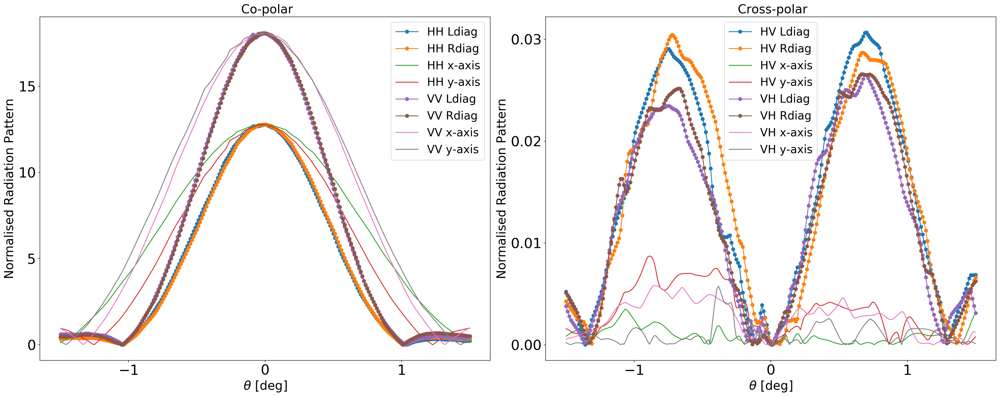

In [106]:
# w = []
# w.append()
# w.append(abs(gdata[10, 0,1,...].imag))
# w.append(abs(gdata[10, 1,1,...].imag))
# w.append(abs(gdata[10, 1,0,...].imag))
# w = np.array(w)
w = np.zeros((2,2,256,256))
w[0,0,...] = abs(gdata[10, 0,0,...].imag/gdata[10, 0,0,...].imag.max()) #xx_re[1]
w[0,1,...] = abs(gdata[10, 0,1,...].imag)#xy_re[1]
w[1,0,...] = abs(gdata[10, 1,1,...].imag)  #yx_re[1]
w[1,1,...] = abs(gdata[10, 1,0,...].imag/gdata[10, 1,0,...].imag.max()) #yy_re[1]

plot_1Dslice(jns_beam=w, beamsize=3.)
w.shape

True


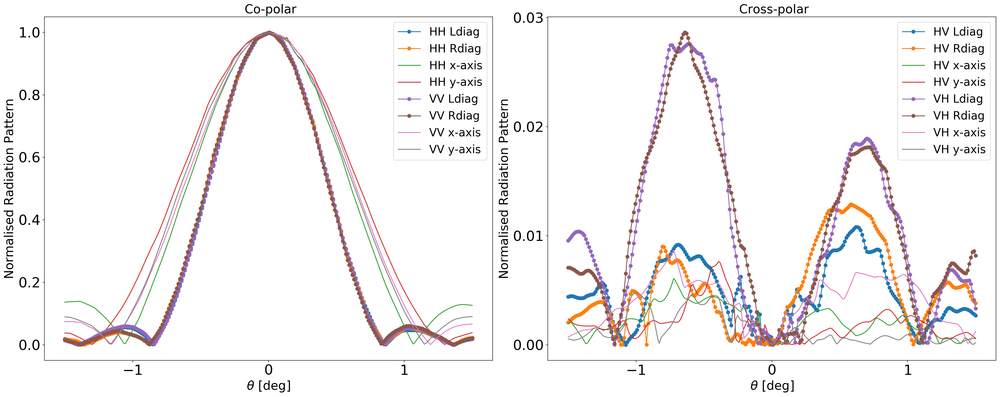

In [105]:
w = np.zeros((2,2,256,256))
w[0,0,...] = abs(gdata[10, 0,0,...].real/gdata[10, 0,0,...].real.max()) #xx_re[1]
w[0,1,...] = abs(gdata[10, 0,1,...].real)#xy_re[1]
w[1,0,...] = abs(gdata[10, 1,1,...].real)  #yx_re[1]
w[1,1,...] = abs(gdata[10, 1,0,...].real/gdata[10, 1,0,...].real.max()) #yy_re[1]

plot_1Dslice(jns_beam=w, beamsize=3.)

In [ ]:
ch = 10
plot_1Dslice(jns_beam=np.nan_to_num(abs(gdata[ch,:,:,:,:])), beamsize=3.)

In [7]:
def jones_to_mueller1(f1,f2=None, sv=True):
	"""
	Convert 2x2xNxN Jones matrix into 4x4xNxN Mueller matrix.
	If f1=f2, compute the autocorrelation version for single dishes
	"""
	if f2==None: f2 = f1
	a, b = f1, f2  #np.load(f1), np.load(f2)
	M = np.zeros((a.shape[0],4,4,a.shape[3],a.shape[4]), dtype=np.complex)
	S = 0.5*np.matrix('1 1 0 0; 0 0 1 1j; 0 0 1 -1j; 1 -1 0 0')
	for f in range(a.shape[0]):
#        print f
		for i in range(a.shape[-2]):
			if i in [50,100,200,300,400,500]: print(i)
			for j in range(a.shape[-1]):
				ab = np.kron(a[f,:,:,i,j],b[f,:,:,i,j].conj())
				M[f,:,:,i,j] = np.dot( np.dot(np.linalg.inv(S), ab), S )
	if sv==True:  np.save('_M.npy', M) #np.save(f1[:-4]+'_M.npy', M)
	return M

def jones_to_mueller2(f1,f2=None, sv=True):
	"""
	Convert 2x2xNxN Jones matrix into 4x4xNxN Mueller matrix.
	If f1=f2, compute the autocorrelation version for single dishes
	"""
	if f2==None: f2 = f1
	a, b = f1, f2  #np.load(f1), np.load(f2)
	M = np.zeros((a.shape[0],4,4,a.shape[3],a.shape[4]), dtype=np.complex)
	S = 0.5*np.matrix('1 1 0 0; 0 0 1 -1j; 0 0 1 1j; 1 -1 0 0')
	for f in range(a.shape[0]):
#        print f
		for i in range(a.shape[-2]):
			if i in [50,100,200,300,400,500]: print(i)
			for j in range(a.shape[-1]):
				ab = np.kron(a[f,:,:,i,j],b[f,:,:,i,j].conj())
				M[f,:,:,i,j] = np.dot( np.dot(np.linalg.inv(S), ab), S )
	if sv==True:  np.save('_M.npy', M) #np.save(f1[:-4]+'_M.npy', M)
	return M

In [8]:
yy = gdata[:, 1,0,... ].copy()
yx = gdata[:, 1,1,... ].copy()

gdata[:, 1,0,... ] = yx
gdata[:, 1,1,... ] = yy

In [10]:
yy = gdata[:, 1,0,... ].copy()
yx = gdata[:, 1,1,... ].copy()

gdata[:, 1,0,... ] = yx
gdata[:, 1,1,... ] = yy

import sys
sys.path.insert(0, '/home/tan/Documents/GSSTI/JGSA/')

import primary_beam_denoising_pipeline as pb

mse, recons, weights = [], [], []
thresh = range(1,11)
K = pb.Singular_Value_Decompostion(gdata)
for i,ii in enumerate(thresh):
    reco, err, w = K.svdrecon(thresh=ii)
    recons.append(reco)
    mse.append(err)
    weights.append(w)

0 0
0 1
1 0
1 1
-- Time taken = 0.05 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes


In [11]:
# Mo.real

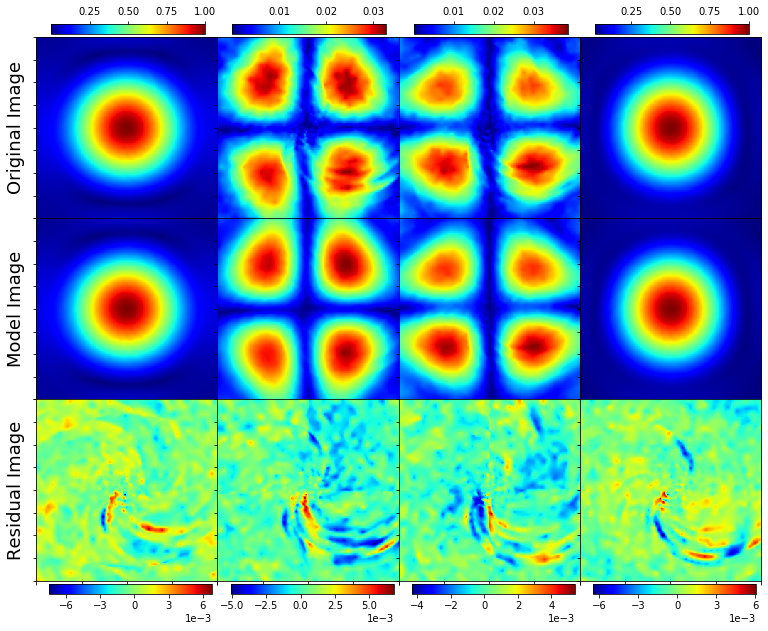

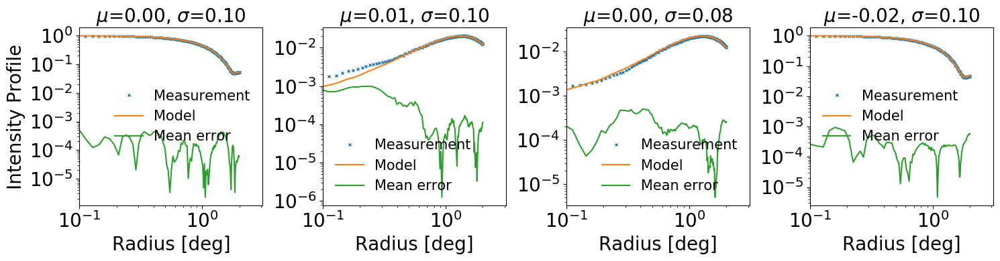

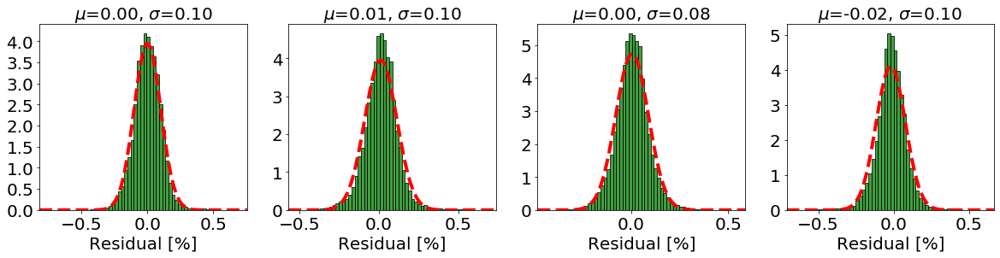

0 0
[87.48138743657098, 1.3718680144300888, 1.233248195009577, 0.26276105281825984, 0.19053350881099046, 0.15402304166089273, 0.14256601425370355, 0.13536866154586538, 0.12586036776848641, 0.05671045327664418]
0 1
[4.099143982757987, 1.0897316215966117, 0.24986608698685628, 0.2469062446603491, 0.18262726673175353, 0.12617907054309885, 0.059134544950901945, 0.058544071705527355, 0.016662022895946735, 0.010900520531241444]
1 0
[4.463745531161889, 0.8936267334659261, 0.28250655679398773, 0.23295366604542211, 0.21249391295224504, 0.13220693774814746, 0.10358318584699834, 0.04790823882097365, 0.04645017468774319, 0.015383291571033957]
1 1
[86.74462174772349, 1.3110679783225339, 1.218302114463315, 0.46505751341341417, 0.21820487201878982, 0.1898690989269682, 0.16565179359072332, 0.16357586604845759, 0.04819168864738826, 0.025211933708393558]


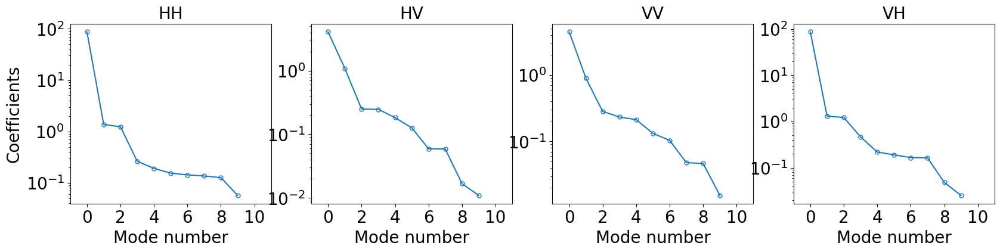

In [12]:
## Using 1 eigenvalue
ch = 10
egn = 3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


In [13]:
from skimage.measure import compare_ssim as ssim

In [14]:
ch = 10
egn = 3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

dat.shape, mod.shape

((2, 2, 256, 256), (2, 2, 256, 256))

In [23]:
OB = dat[0,0,...]
DB = mod[0,0,...]
# Step I
diff = abs(OB - DB)

In [18]:
# https://ourcodeworld.com/articles/read/991/how-to-calculate-the-structural-similarity-index-ssim-between-two-images-with-python

In [32]:
(score1, dif1) = ssim(X = abs(OB), Y=abs(OB - DB), win_size=None, gradient=False, data_range=None, 
     multichannel=False, gaussian_weights=False, full=True) 

(score2, dif2) = ssim(X = abs(OB), Y=abs(DB), win_size=None, gradient=False, data_range=None, 
     multichannel=False, gaussian_weights=False, full=True) 

In [33]:
score1, score2

(0.14922397442169677, 0.999815070002567)

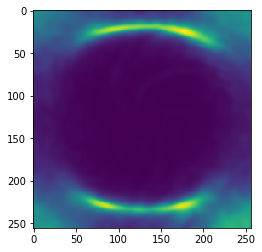

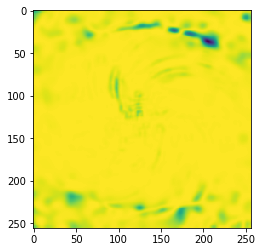

In [34]:
plt.figure(1);plt.imshow(dif1)
plt.figure(2);plt.imshow(dif2)

In [36]:
np.corrcoef(dif1.ravel(), dif2.ravel())

array([[ 1.        , -0.50268314],
       [-0.50268314,  1.        ]])

In [37]:
np.corrcoef(abs(OB).ravel(), abs(DB).ravel())

array([[1.        , 0.99999233],
       [0.99999233, 1.        ]])

50
100
200


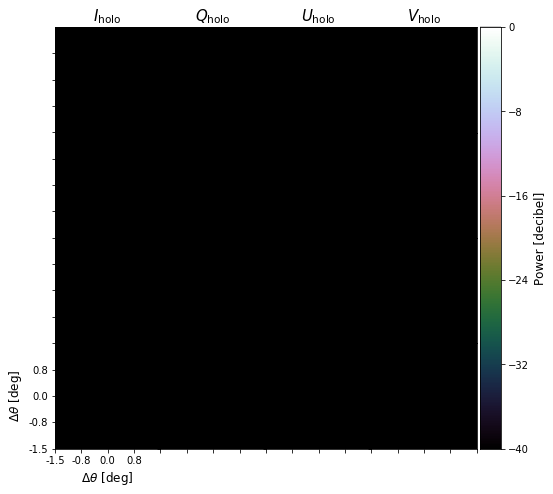

In [77]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

# dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:])) - 10.*np.log10(np.abs(recons[egn][ch,:,:,:,:]))
# Mo = jones_to_mueller1(f1 = np.reshape(dnn, (1,2,2,256,256)),f2=None, sv=True)
Mo = jones_to_mueller1(f1 = np.reshape(dat - mod, (1,2,2,256,256)),f2=None, sv=True)
fov=3;fs=8;vmin=-40
dnh = 10.*np.log10(np.abs(Mo[0]))
plot2d_multi(dnh, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

# M = jones_to_mueller1(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
# dn1 = 10.*np.log10(np.abs(M[0]))
# fov=3;fs=8;vmin=-40
# plot2d_multi(dn1, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
#                                                                 r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

# M = jones_to_mueller1(f1 = np.reshape(mod, (1,2,2,256,256)),f2=None, sv=True)
# dn2 = 10.*np.log10(np.abs(M[0]))
# fov=3;fs=8; vmin=-40
# plot2d_multi(dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm svd}$', r'$Q_{\rm svd}$',
#                                                                 r'$U_{\rm svd}$', r'$V_{\rm svd}$'])


# # dn = 10.*np.log10(np.abs(dat - mod))
# # fov=3;fs=8;vmin=-40
# plot2d_multi(dn1 - dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
#                                                                 r'$U_{\rm err}$', r'$V_{\rm err}$'])

50
100
200


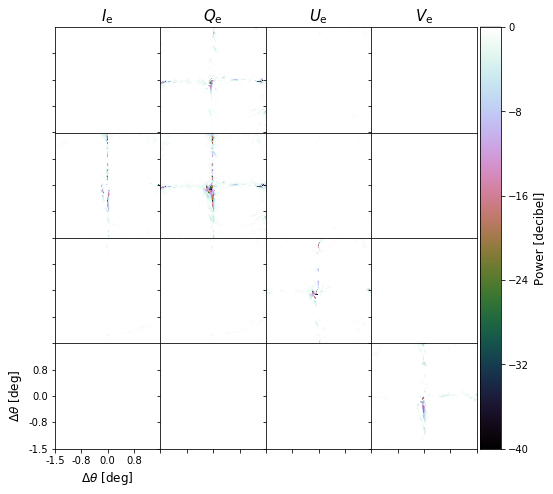

In [107]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

dnn = -10.*np.log10(np.abs(gdata[ch,:,:,:,:])) + 10.*np.log10(np.abs(recons[egn][ch,:,:,:,:]))
# dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:]))  
# dnn = np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:])
# dnn = gdata[ch,:,:,:,:] - recons[egn][ch,:,:,:,:]
Mo = jones_to_mueller1(f1 = np.reshape(dnn, (1,2,2,256,256)),f2=None, sv=True)
# Mo = jones_to_mueller1(f1 = np.reshape(dat - mod, (1,2,2,256,256)),f2=None, sv=True)
fov=3;fs=8;vmin=-40
# dnh = 10.*np.log10(np.abs(Mo[0]))
# dnh = np.abs(Mo[0])
dnh = Mo[0].real
plot2d_multi(dnh, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm e}$', r'$Q_{\rm e}$',
                                                                r'$U_{\rm e}$', r'$V_{\rm e}$'])

In [ ]:
[r'$I_{\rm err}$', r'$Q_{\rm err}$',r'$U_{\rm err}$', r'$V_{\rm err}$']

50
100
200


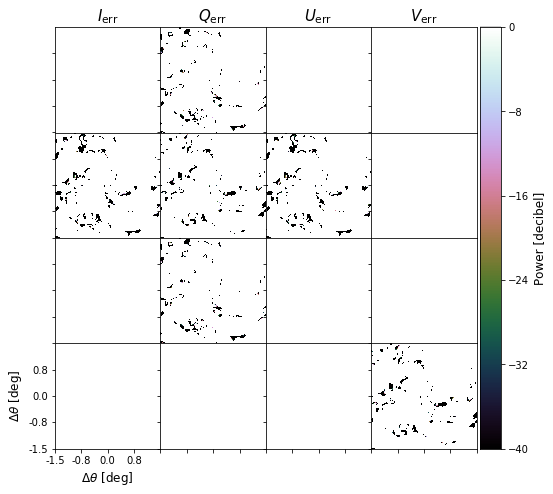

In [102]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

# dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:])) - 10.*np.log10(np.abs(recons[egn][ch,:,:,:,:]))
dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:]))  
# dnn = np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:])
# dnn = gdata[ch,:,:,:,:] - recons[egn][ch,:,:,:,:]
Mo = jones_to_mueller1(f1 = np.reshape(dnn, (1,2,2,256,256)),f2=None, sv=True)
# Mo = jones_to_mueller1(f1 = np.reshape(dat - mod, (1,2,2,256,256)),f2=None, sv=True)
fov=3;fs=8;vmin=-40
# dnh = 10.*np.log10(np.abs(Mo[0]))
# dnh = np.abs(Mo[0])
dnh = Mo[0].real
plot2d_multi(dnh, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
                                                          r'$U_{\rm err}$', r'$V_{\rm err}$'])

50
100
200


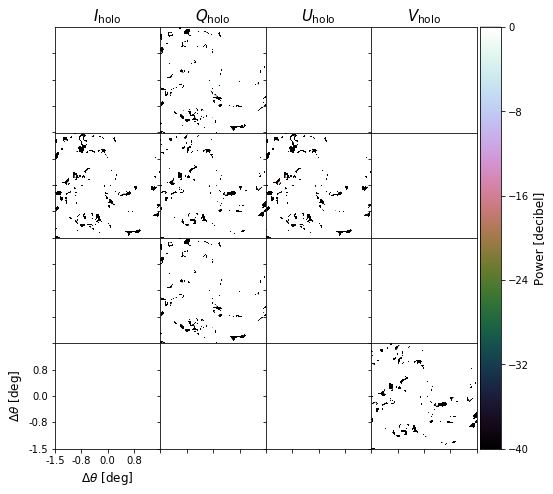

In [90]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

# dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:])) - 10.*np.log10(np.abs(recons[egn][ch,:,:,:,:]))
dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:]))  
# dnn = np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:])
# dnn = gdata[ch,:,:,:,:] - recons[egn][ch,:,:,:,:]
Mo = jones_to_mueller1(f1 = np.reshape(dnn, (1,2,2,256,256)),f2=None, sv=True)
# Mo = jones_to_mueller1(f1 = np.reshape(dat - mod, (1,2,2,256,256)),f2=None, sv=True)
fov=3;fs=8;vmin=-40
# dnh = 10.*np.log10(np.abs(Mo[0]))
# dnh = np.abs(Mo[0])
dnh = Mo[0].real
plot2d_multi(dnh, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

50
100
200


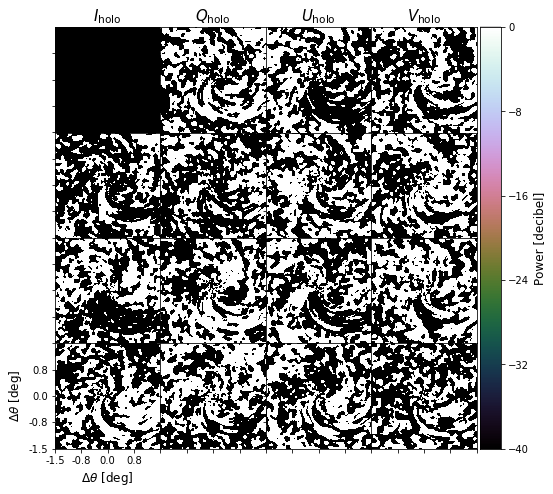

In [98]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:])) - 10.*np.log10(np.abs(recons[egn][ch,:,:,:,:]))
# dnn = 10.*np.log10(np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:]))  
# dnn = np.abs(gdata[ch,:,:,:,:]) - np.abs(recons[egn][ch,:,:,:,:])
dnn = gdata[ch,:,:,:,:] - recons[egn][ch,:,:,:,:]
Mo = jones_to_mueller1(f1 = np.reshape(dnn, (1,2,2,256,256)),f2=None, sv=True)
# Mo = jones_to_mueller1(f1 = np.reshape(dat - mod, (1,2,2,256,256)),f2=None, sv=True)
fov=3;fs=8;vmin=-40
# dnh = 10.*np.log10(np.abs(Mo[0]))
# dnh = np.abs(Mo[0])
# dnh = Mo[0].real
dnh = 10.*np.log10(Mo[0].real)
plot2d_multi(dnh, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

50
100
200


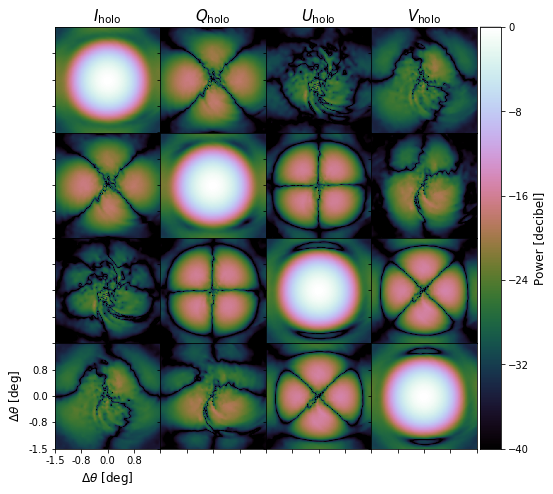

50
100
200


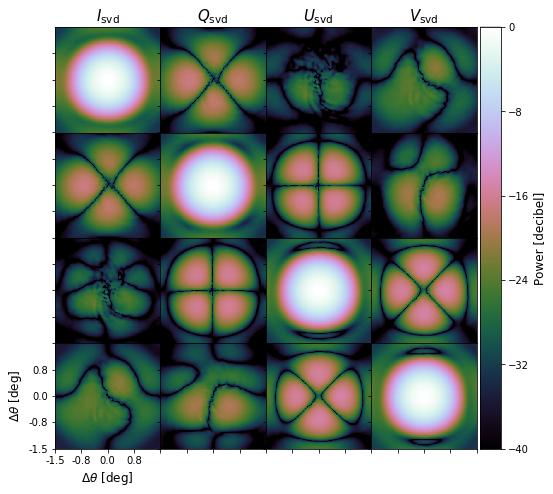

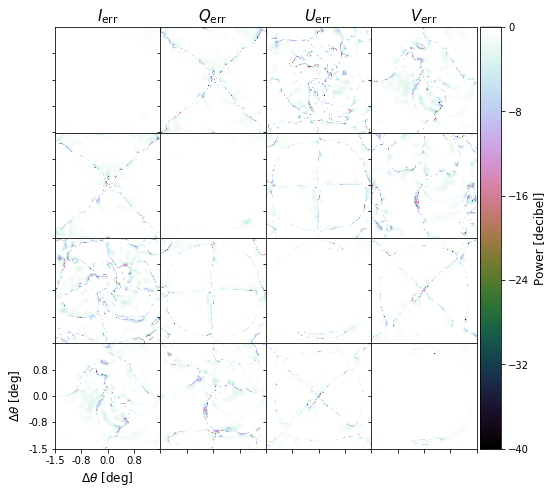

In [104]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

M = jones_to_mueller1(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
dn1 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8;vmin=-40
plot2d_multi(dn1, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

M = jones_to_mueller1(f1 = np.reshape(mod, (1,2,2,256,256)),f2=None, sv=True)
dn2 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8; vmin=-40
plot2d_multi(dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm svd}$', r'$Q_{\rm svd}$',
                                                                r'$U_{\rm svd}$', r'$V_{\rm svd}$'])


# dn = 10.*np.log10(np.abs(dat - mod))
# fov=3;fs=8;vmin=-40
plot2d_multi(dn1 - dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
                                                                r'$U_{\rm err}$', r'$V_{\rm err}$'])

50
100
200


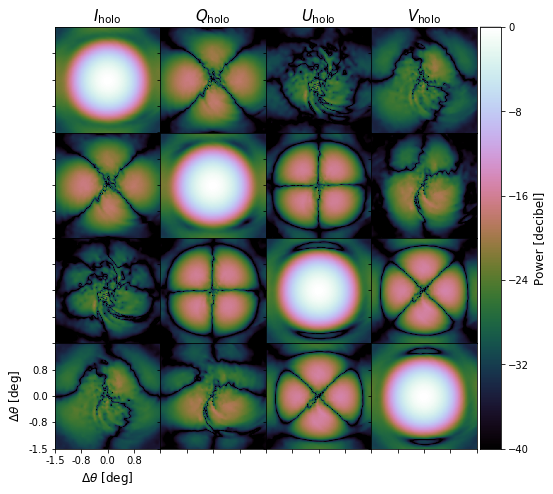

50
100
200


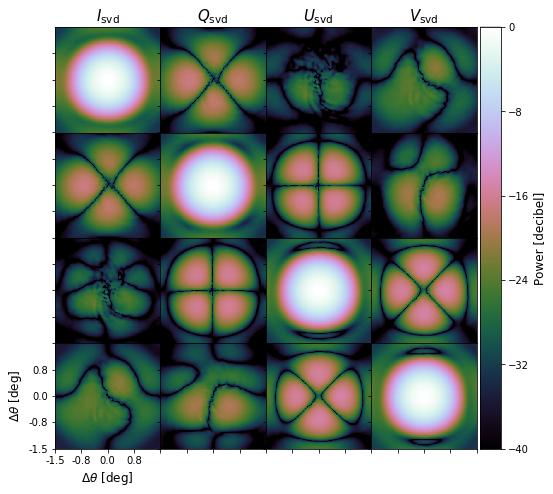

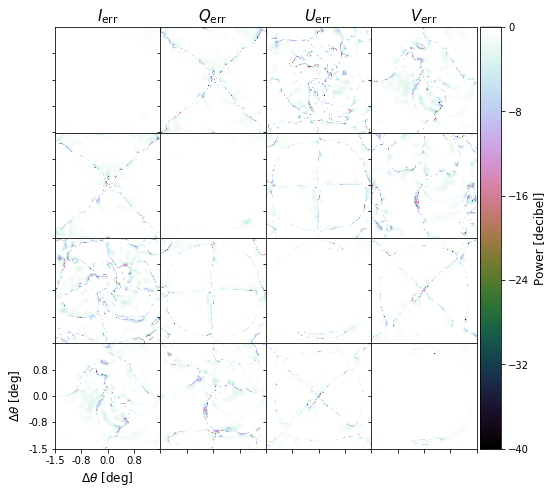

In [106]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

M = jones_to_mueller2(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
dn1 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8;vmin=-40
plot2d_multi(dn1, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

M = jones_to_mueller2(f1 = np.reshape(mod, (1,2,2,256,256)),f2=None, sv=True)
dn2 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8; vmin=-40
plot2d_multi(dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm svd}$', r'$Q_{\rm svd}$',
                                                                r'$U_{\rm svd}$', r'$V_{\rm svd}$'])


# dn = 10.*np.log10(np.abs(dat - mod))
# fov=3;fs=8;vmin=-40
plot2d_multi(dn1 - dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
                                                                r'$U_{\rm err}$', r'$V_{\rm err}$'])

In [78]:
gdata[ch,:,:,:,:].shape, recons[egn][ch,:,:,:,:].shape, dnn.shape, Mo.shape, np.abs(Mo[0]).shape

((2, 2, 256, 256),
 (2, 2, 256, 256),
 (2, 2, 256, 256),
 (1, 4, 4, 256, 256),
 (4, 4, 256, 256))

In [ ]:
beamsim1(Mu,nu=10,fov=3,fs=8,vmin=-40)

In [58]:
M = jones_to_mueller1(f1 = gdata[:],f2=None, sv=True)

50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200


In [7]:
M.shape

(1, 4, 4, 256, 256)

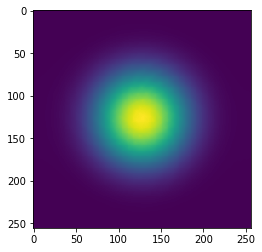

In [16]:
plt.imshow(M[0,1,1,...].real)

In [38]:
# M = np.zeros((gdata.shape[0],4,4,gdata.shape[3],gdata.shape[4]), dtype=np.complex)
# S = 0.5*np.matrix('1 1 0 0; 0 0 1 1j; 0 0 1 -1j; 1 -1 0 0')

# for ch in range(gdata.shape[0]):
#     print(ch)
#     ab = np.kron(gdata[ch],gdata[ch].conj())
#     M[f,...] = np.dot( np.dot(np.linalg.inv(S), ab), S )

In [21]:
gdata[0,...].shape

(2, 2, 256, 256)

In [24]:
gdata[0,...].reshape(1,2, 2, 256, 256).shape

(1, 2, 2, 256, 256)

In [39]:
# jones_to_mueller(f1 = gdata ,f2=None, sv=True)

In [61]:
import utilities as ut
# ut.plot2d_multi(gdata[0,...].real, diameter=8, vrange=None, title='')

In [60]:
from mother import *

In [59]:
def beamsim1(inp,nu,fov,fs,vmin):
    d = inp #np.load(inp)
    freqs = [1200,1400,1600,1800]
    d_nu = d[nu,:,:,:,:]
    dn = 10.*np.log10(np.abs(d_nu))
#     if 'holo' in inp: st = 'Holographic observation'
#     else: st = 'EM simulated model'
#     print( 'Primary beam Mueller matrix at 900MHz: %s, FoV=%i deg'%(st,fov))
    plot2d_multi(dn, fov=fov, vmin=vmin,vmax=0,fs=fs, title=['I', 'Q', 'U', 'V'])
    P = np.abs(d[:,0,1,:,:] + 1j * d[:,0,2,:,:])
    I = np.abs(d[:,0,0,:,:])
    L = P/I
    print(L.shape)
    x = np.linspace(0,fov/2, len(radial_profile(L[0,:,:])))
    f, ax = pl.subplots(1,2, figsize=(10,5), sharex=True, sharey=True)
    ax[0].set_title('Stokes P=|Q+iU| to I leakage')
    for i in range(4): ax[0].plot(x,radial_profile(10.*np.log10(L[i,:,:])), label='%i MHz'%freqs[i])
#     axr = ax[0].twinx()
#     for i in range(4): axr.plot(x,radial_profile(L[i,:,:]*100.), visible=False)
#     axr.set_ylabel('Leakage [%]')
    ax[0].legend()
    ax[0].grid(linestyle='dotted')
    ax[0].set_xlabel('Radius [deg]')
    ax[0].set_ylabel('Leakage [decibel]')
    ax[1].set_title('Diagonal terms of the beam at 1400 MHz')
    ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,0,0,:,:]))), label='I beam')
    ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,1,1,:,:]))), label='Q beam')
    ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,2,2,:,:]))), label='U beam')
    ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,3,3,:,:]))), label='V beam')
    ax[1].grid(linestyle='dotted')
    ax[1].legend()
#     ax[2].set_title('Diagonal terms of the beam at 1400 MHz')
#     ax[2].plot(x,10.*np.log10(radial_profile(np.abs(d[0,0,1,:,:]))), label='Q into I beam')
#     ax[2].plot(x,10.*np.log10(radial_profile(np.abs(d[0,0,2,:,:]))), label='U into I beam')
#     ax[2].plot(x,10.*np.log10(radial_profile(np.abs(d[0,0,3,:,:]))), label='V into I beam')
# #     ax[2].plot(x,10.*np.log10(radial_profile(np.abs(d[0,3,3,:,:]))), label='V beam')
#     ax[2].grid(linestyle='dotted')
#     ax[2].legend()
    pl.tight_layout()
#     pl.show()

In [101]:
gdata.shape

(20, 2, 2, 256, 256)

In [102]:
Mu = jones_to_mueller1(f1 = gdata[:], f2=None, sv=True)

50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200
50
100
200


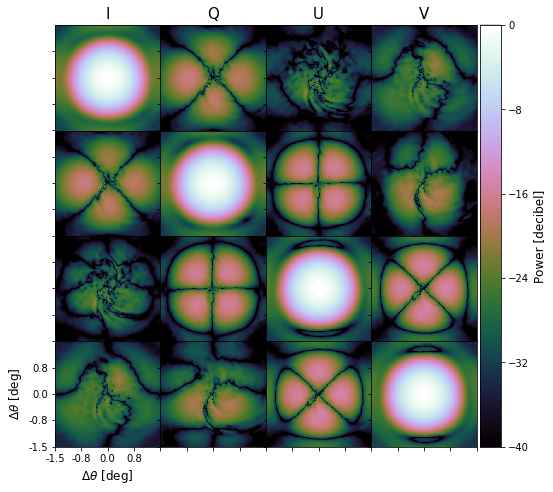

(20, 256, 256)


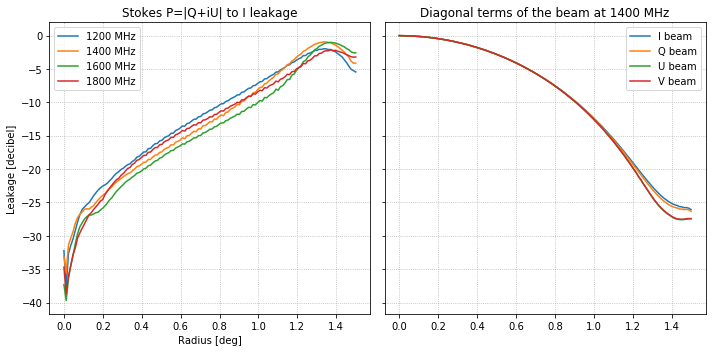

In [109]:
beamsim1(Mu,nu=10,fov=3,fs=8,vmin=-40)

In [29]:
fov = 8
list(map(int,np.linspace(-fov/2., fov/2., 5)))

[-4, -2, 0, 2, 4]

In [15]:
# from mother import *
# pre = '/Volumes/NIMIKH/Data/meerkat_beam/'

# # sftp://narh@aretha.ru.ac.za/home/narh/2019SKA_research/meerkat_work/mother.py

# def beamsim(inp,nu,fov,fs,vmin):
#     d =  inp #np.load(inp)
#     freqs = [900,1100,1285,1350]
#     d_nu = d[nu,:,:,:,:]
#     dn = 10.*np.log10(np.abs(d_nu))
#     if 'holo' in inp: st = 'Holographic observation'
#     else: st = 'EM simulated model'
#     print( 'Primary beam Mueller matrix at 900MHz: %s, FoV=%i deg'%(st,fov))
#     plot2d_multi(dn, fov=fov, vmin=vmin,vmax=0,fs=fs)
#     P = np.abs(d[:,0,1,:,:] + 1j * d[:,0,2,:,:])
#     I = np.abs(d[:,0,0,:,:])
#     L = P/I
#     x = np.linspace(0,fov/2, len(radial_profile(L[0,:,:])))
#     f, ax = pl.subplots(1,2, figsize=(12,4), sharex=True, sharey=True)
#     ax[0].set_title('Stokes P=|Q+iU| to I leakage')
#     for i in range(4): ax[0].plot(x,radial_profile(10.*np.log10(L[i,:,:])), label=freqs[i])
#     axr = ax[0].twinx()
#     for i in range(4): axr.plot(x,radial_profile(L[i,:,:]*100.), visible=False)
#     axr.set_ylabel('Leakage [%]')
#     ax[0].legend()
#     ax[0].grid()
#     ax[0].set_xlabel('Radius [deg]')
#     ax[0].set_ylabel('Leakage [decibel]')
#     ax[1].set_title('Diagonal terms of the beam at 900MHz')
#     ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,1,1,:,:]))), label='I beam')
#     ax[1].plot(x,10.*np.log10(radial_profile(np.abs(d[0,0,0,:,:]))), label='Q beam')
#     ax[1].grid()
#     ax[1].legend()
#     pl.show()
#     pl.close()

In [ ]:
# beamsim(pre + 'em/beam_6deg_Mueller.npy',nu=0,fov=6,fs=8,vmin=-40)

In [5]:
256*256

65536

### Reconstruct Beam from SVD

In [5]:
# u,s,v = K.svdecom()

In [34]:
import sys
sys.path.insert(0, '/home/tan/Documents/GSSTI/JGSA/')

import primary_beam_denoising_pipeline as pb

mse, recons, weights = [], [], []
thresh = range(1,11)
K = pb.Singular_Value_Decompostion(gdata)
for i,ii in enumerate(thresh):
    reco, err, w = K.svdrecon(thresh=ii)
    recons.append(reco)
    mse.append(err)
    weights.append(w)

0 0
0 1
1 0
1 1
-- Time taken = 0.04 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.03 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.04 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.04 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.04 minutes
0 0
0 1
1 0
1 1
-- Time taken = 0.04 minutes


In [7]:
# K[0].shape

TypeError: 'Singular_Value_Decompostion' object does not support indexing

In [11]:
K

### Visualise Original & Reconstructed Beams

In [64]:
mod.shape

(2, 2, 256, 256)

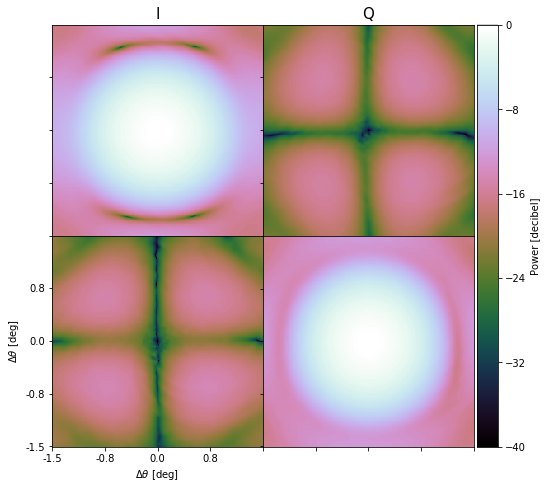

In [71]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

dn = 10.*np.log10(np.abs(mod))
fov=3;fs=8;vmin=-40
plot2d_multi(dn, fov=fov, vmin=vmin,vmax=0,fs=fs, title=['I', 'Q', 'U', 'V'])

# dn = 10.*np.log10(np.abs(dat))
# fov=3;fs=8; vmin=-40
# plot2d_multi(dn, fov=fov, vmin=vmin,vmax=0,fs=fs, title=['I', 'Q', 'U', 'V'])


# dn = 10.*np.log10(np.abs(dat - mod))
# fov=3;fs=8;vmin=-40
# plot2d_multi(dn, fov=fov, vmin=vmin,vmax=0,fs=fs, title=['I', 'Q', 'U', 'V'])

In [74]:
dat.shape

(2, 2, 256, 256)

In [79]:
GG = dat.reshape(1,2,2,256,256)
GG.shape

(1, 2, 2, 256, 256)

In [85]:
M = jones_to_mueller1(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
M[0].shape

50
100
200


(4, 4, 256, 256)

50
100
200


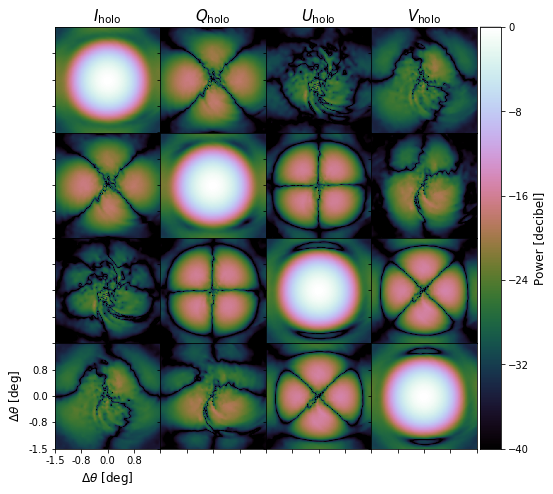

50
100
200


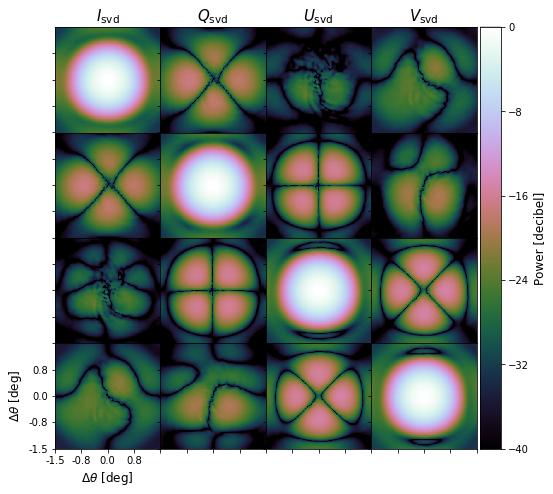

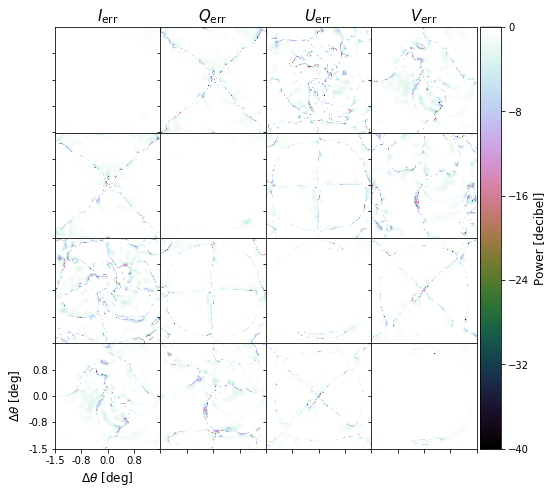

In [98]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

M = jones_to_mueller1(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
dn1 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8;vmin=-40
plot2d_multi(dn1, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

M = jones_to_mueller1(f1 = np.reshape(mod, (1,2,2,256,256)),f2=None, sv=True)
dn2 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8; vmin=-40
plot2d_multi(dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm svd}$', r'$Q_{\rm svd}$',
                                                                r'$U_{\rm svd}$', r'$V_{\rm svd}$'])


# dn = 10.*np.log10(np.abs(dat - mod))
# fov=3;fs=8;vmin=-40
plot2d_multi(dn1 - dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
                                                                r'$U_{\rm err}$', r'$V_{\rm err}$'])

50
100
200


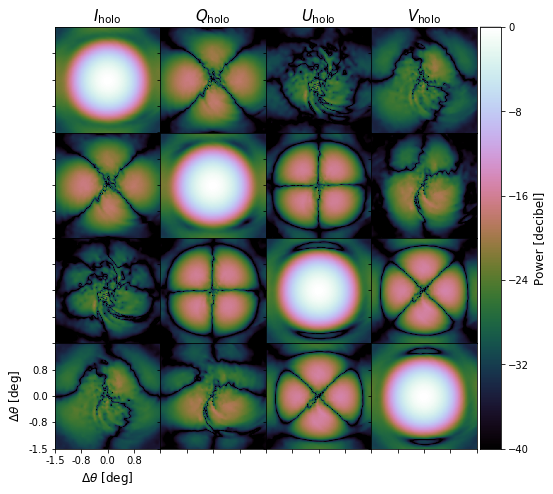

50
100
200


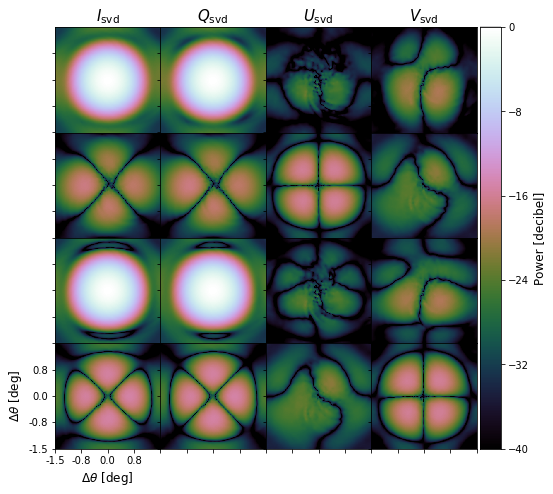

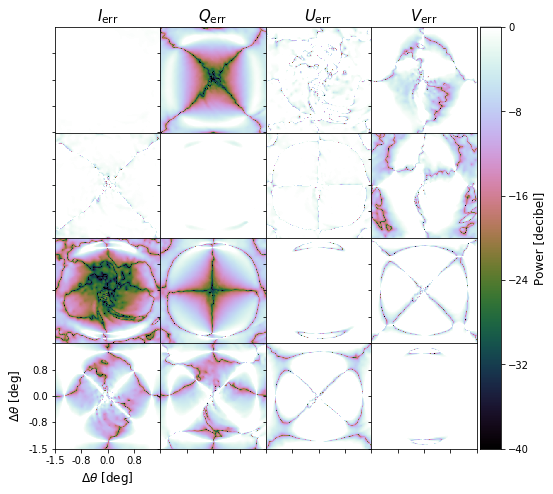

In [62]:
from mother import *
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]

M = jones_to_mueller1(f1 = np.reshape(dat, (1,2,2,256,256)),f2=None, sv=True)
dn1 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8;vmin=-40
plot2d_multi(dn1, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm holo}$', r'$Q_{\rm holo}$',
                                                                r'$U_{\rm holo}$', r'$V_{\rm holo}$'])

M = jones_to_mueller1(f1 = np.reshape(mod, (1,2,2,256,256)),f2=None, sv=True)
dn2 = 10.*np.log10(np.abs(M[0]))
fov=3;fs=8; vmin=-40
plot2d_multi(dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm svd}$', r'$Q_{\rm svd}$',
                                                                r'$U_{\rm svd}$', r'$V_{\rm svd}$'])


# dn = 10.*np.log10(np.abs(dat - mod))
# fov=3;fs=8;vmin=-40
plot2d_multi(dn1 - dn2, fov=fov, vmin=vmin,vmax=0,fs=fs, title=[r'$I_{\rm err}$', r'$Q_{\rm err}$',
                                                                r'$U_{\rm err}$', r'$V_{\rm err}$'])

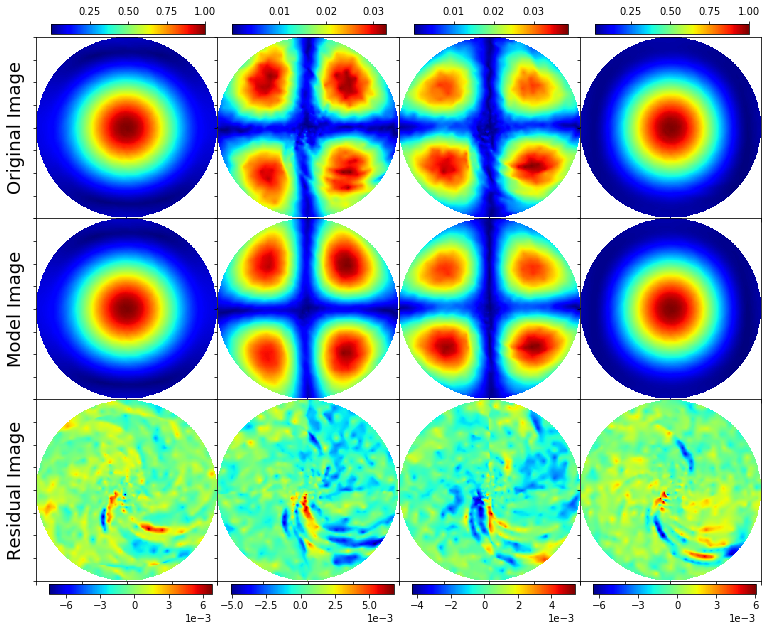

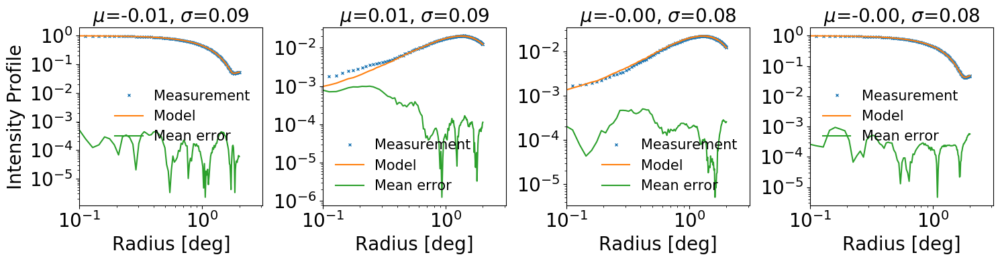

AttributeError: 'Rectangle' object has no property 'weight'

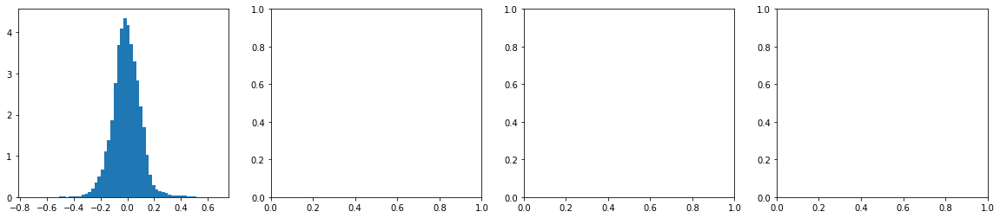

In [63]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


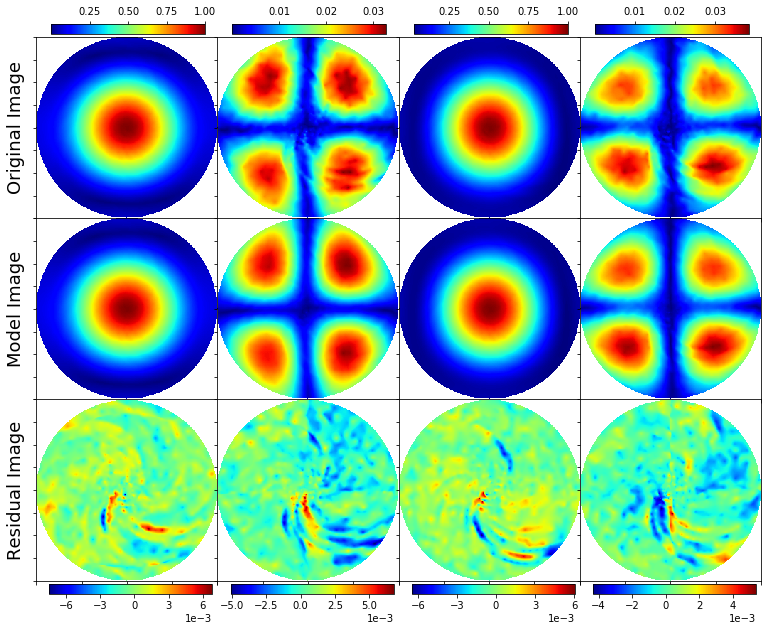

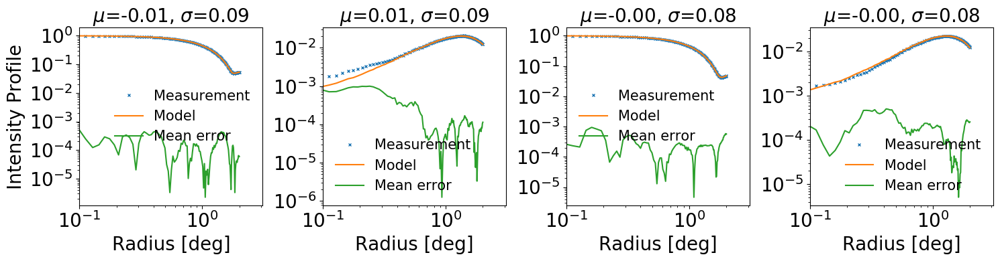

AttributeError: 'Rectangle' object has no property 'weight'

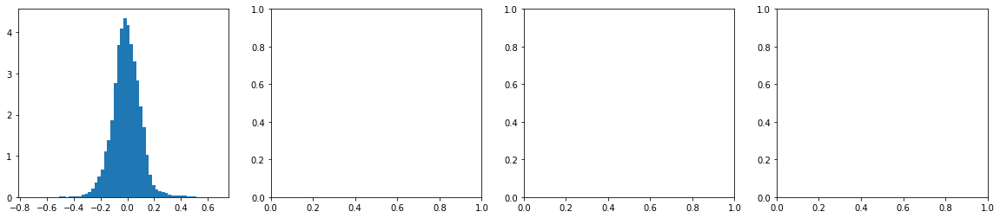

In [69]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


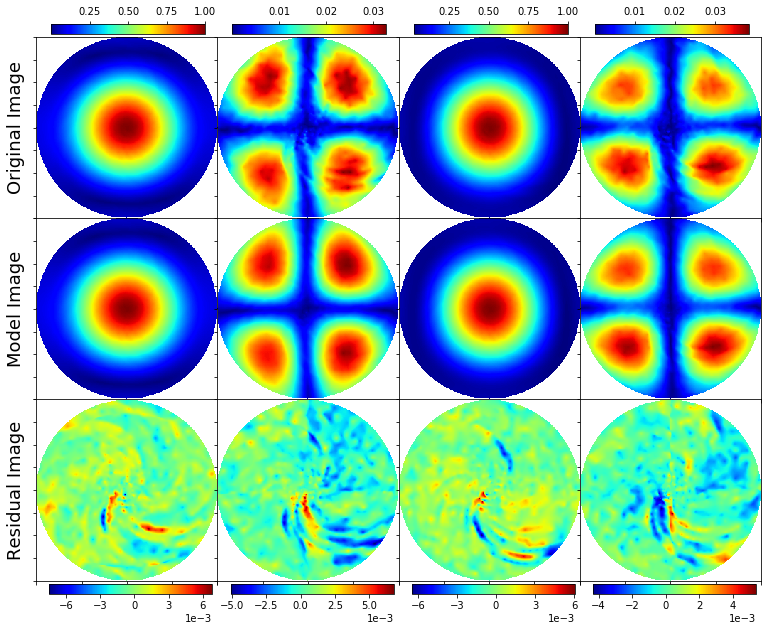

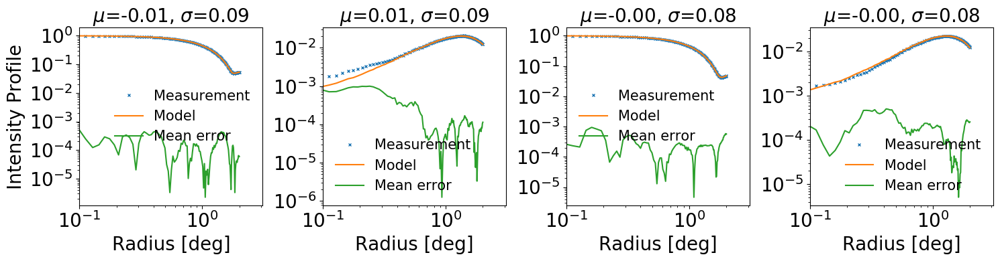

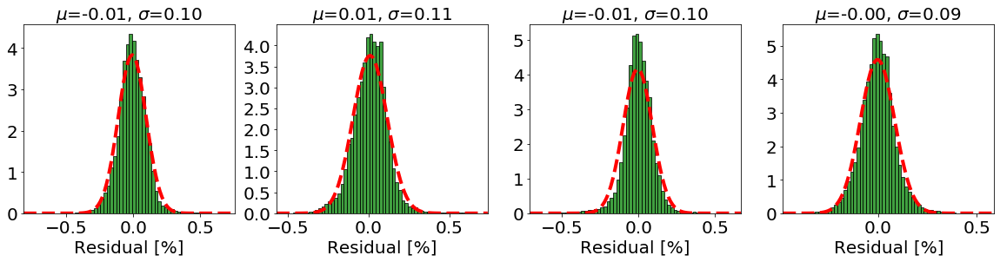

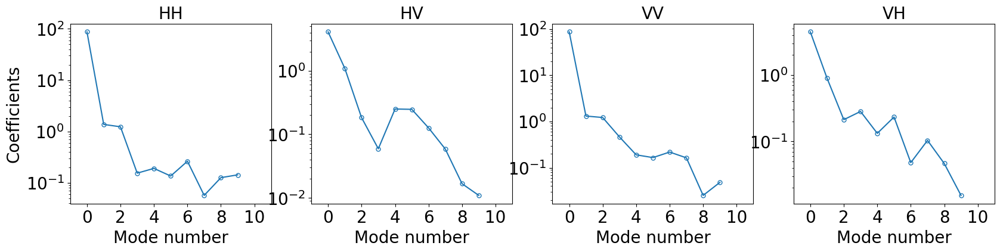

In [64]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


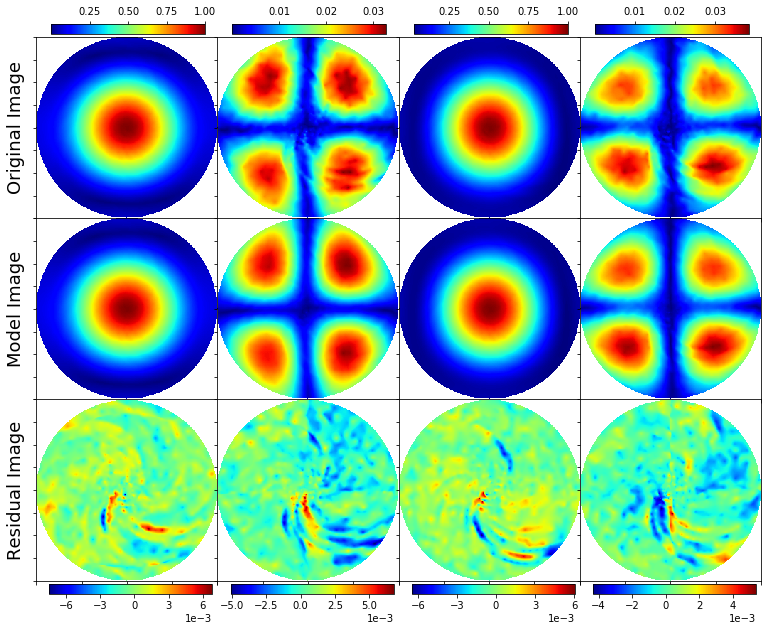

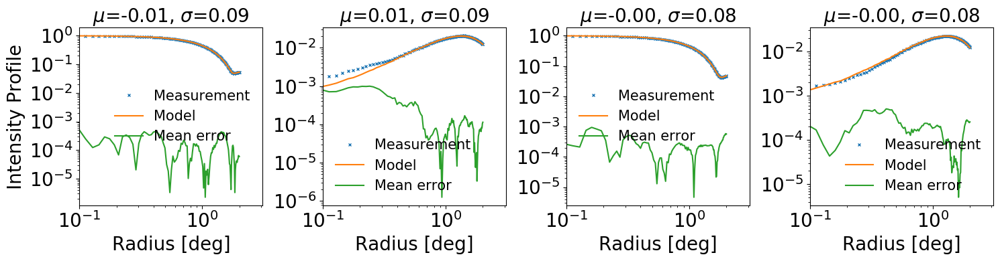

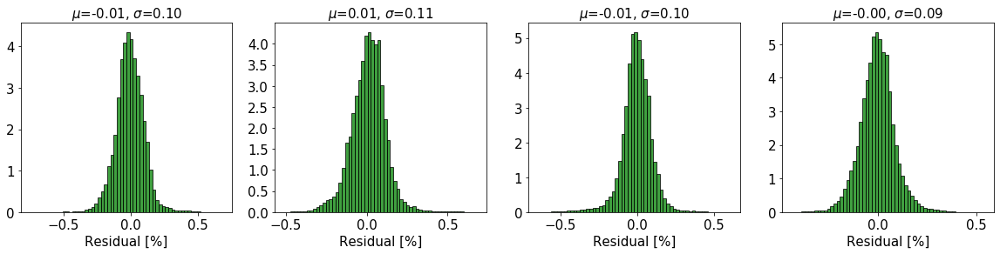

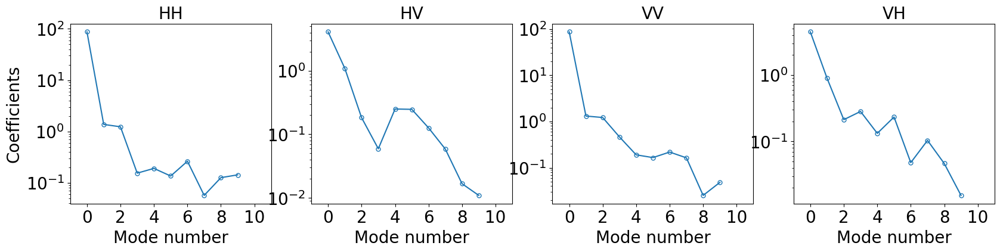

In [58]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


In [39]:
def plot_1Dslice(jns_beam, beamsize=6.):
    """
    Generates 1D profile of Jones beams in (2,2,N,N) format
    ** jns_beam:: Jones beams
    ** beamsize:: image size in degrees
    return::
      * Left & right diagonal plots
      * Horizontal & vertical plots
    """
    shp = jns_beam.shape[-1]
    fig = plt.figure(1, figsize=(25,10), dpi=150)
    n = 1
    x = np.linspace(-beamsize/2.,beamsize/2.,shp)
    ax = fig.add_subplot(1,2, n)
    ax.plot(x,jns_beam[0,0,...].diagonal(), linestyle='-', marker='o', label='HH Ldiag')
    ax.plot(x,np.rot90(jns_beam[0,0,...]).diagonal(), linestyle='-', marker='o', label='HH Rdiag')
    ax.plot(x,jns_beam[0,0,...][jns_beam[0,0,...].shape[-1]//2,:], label='HH x-axis')
    print(True)
    ax.plot(x,jns_beam[0,0,...][:,jns_beam[0,0,...].shape[-1]//2], label='HH y-axis')
    #ax.plot(x,VV_re[1].diagonal(), label='VV')
#     print(True)
    ax.plot(x,jns_beam[1,1,...].diagonal(), linestyle='-', marker='o', label='VV Ldiag')
    ax.plot(x,np.rot90(jns_beam[1,1,...]).diagonal(), linestyle='-', marker='o', label='VV Rdiag')
    ax.plot(x,jns_beam[1,1,...][jns_beam[1,1,...].shape[-1]//2,:], label='VV x-axis')
    ax.plot(x,jns_beam[1,1,...][:,jns_beam[1,1,...].shape[-1]//2], label='VV y-axis')
    ax.set_xlabel(r'$\theta$ [deg]', fontsize=22)
    ax.set_ylabel(r'Normalised Radiation Pattern', fontsize=22)
    ax.set_title(r' Co-polar',fontsize=22)
    ax.legend(loc=0, fontsize=20)
    for tick in ax.xaxis.get_major_ticks(): tick.label.set_fontsize(25) 
    for tick in ax.yaxis.get_major_ticks(): tick.label.set_fontsize(25)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=5)
    
    n+=1
    

    ax = fig.add_subplot(1,2, n)
    ax.plot(x,jns_beam[0,1,...].diagonal(),linestyle='-', marker='o', label='HV Ldiag')
    ax.plot(x,np.rot90(jns_beam[0,1,...]).diagonal(), linestyle='-', marker='o', label='HV Rdiag')
    ax.plot(x,jns_beam[0,1,...][jns_beam[0,1,...].shape[-1]//2,:], label='HV x-axis')
    ax.plot(x,jns_beam[0,1,...][:,jns_beam[0,1,...].shape[-1]//2], label='HV y-axis')
#     ax.plot(x,VV_re[1].diagonal(), label='VV')
    ax.plot(x,jns_beam[1,0,...].diagonal(), linestyle='-', marker='o', label='VH Ldiag')
    ax.plot(x,np.rot90(jns_beam[1,0,...]).diagonal(), linestyle='-', marker='o', label='VH Rdiag')
    ax.plot(x,jns_beam[1,0,...][jns_beam[1,0,...].shape[-1]//2,:], label='VH x-axis')
    ax.plot(x,jns_beam[1,0,...][:,jns_beam[1,0,...].shape[-1]//2], label='VH y-axis')
    ax.set_xlabel(r'$\theta$ [deg]', fontsize=22)
    ax.set_ylabel(r'Normalised Radiation Pattern', fontsize=22)
    ax.set_title(r' Cross-polar',fontsize=22)
    ax.legend(loc=0, fontsize=20)
    for tick in ax.xaxis.get_major_ticks(): tick.label.set_fontsize(25) 
    for tick in ax.yaxis.get_major_ticks(): tick.label.set_fontsize(25)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=5)
        
    plt.tight_layout()
    
    return None 

True


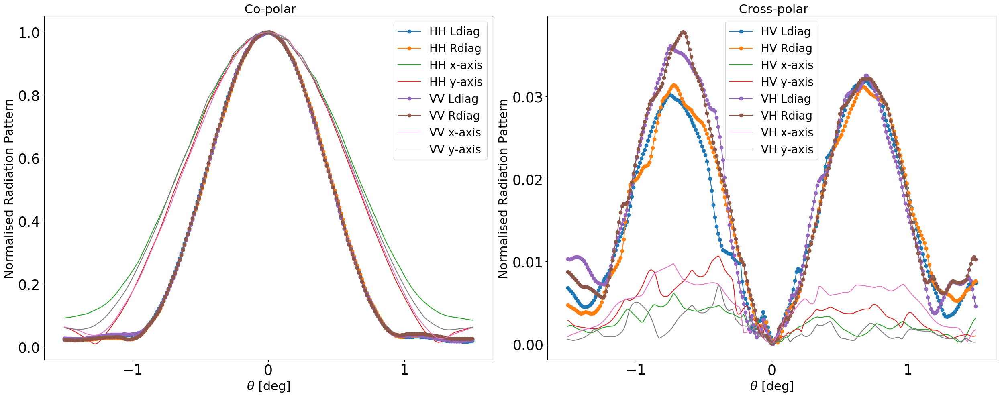

In [7]:
ch = 10
beams = np.zeros((2,2,256,256))
beams[0,0,...] = abs(gdata[ch,0,0,...]) #xx_re[1]
beams[0,1,...] = abs(gdata[ch,0,1,...]) #xy_re[1]
beams[1,0,...] = abs(gdata[ch,1,1,...]) #yx_re[1]
beams[1,1,...] = abs(gdata[ch,1,0,...]) #yy_re[1]


plot_1Dslice(jns_beam=np.nan_to_num(beams), beamsize=3.)

True


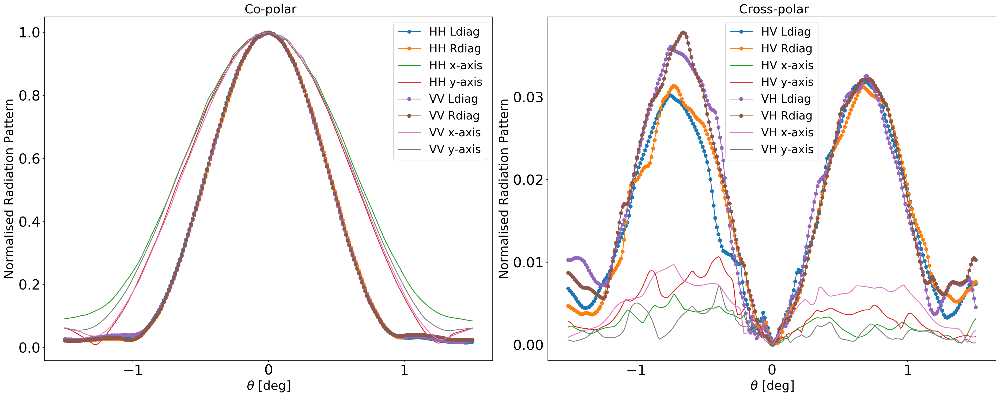

In [67]:
ch = 10
plot_1Dslice(jns_beam=np.nan_to_num(abs(gdata[ch,:,:,:,:])), beamsize=3.)

True


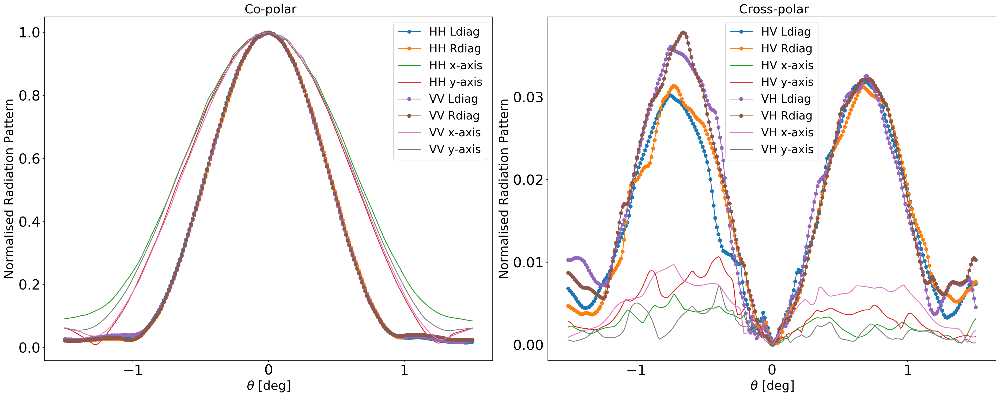

In [40]:
ch = 10
plot_1Dslice(jns_beam=np.nan_to_num(abs(gdata[ch,:,:,:,:])), beamsize=3.)

In [41]:
shp = gdata[ch,:,:,:,:].shape[-1]
beamsize=3.
x = np.linspace(-beamsize/2.,beamsize/2.,shp)

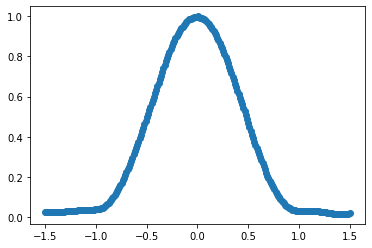

In [61]:
#90 arcmin
jns_beam = abs(gdata[ch,:,:,:,:].copy())
plt.plot(x,jns_beam[0,0,...].diagonal(), linestyle='-', marker='o', label='HH Ldiag')

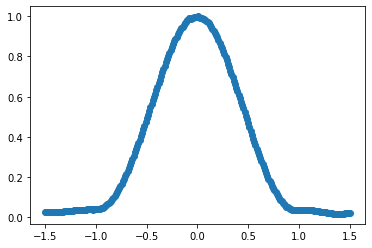

In [74]:
plt.plot(x,jns_beam[1,1,...].diagonal(), linestyle='-', marker='o', label='HH Ldiag')

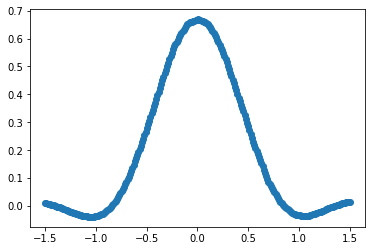

In [43]:
#90 arcmin
# jns_beam = gdata[ch,:,:,:,:].copy()
plt.plot(x,jns_beam[1,1,...].diagonal(), linestyle='-', marker='o', label='HH Ldiag')

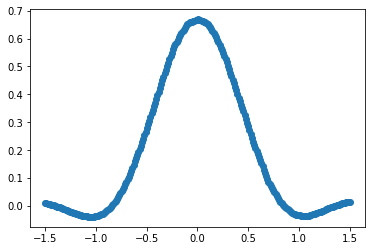

In [49]:
jns_beam = gdata[ch,:,:,:,:].copy()
plt.plot(x,jns_beam[1,1,...].T.diagonal(), linestyle='-', marker='o', label='HH Ldiag')

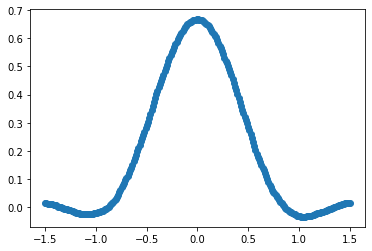

In [59]:
#63
plt.plot(x,np.rot90(jns_beam[0,0,...]).diagonal(), linestyle='-', marker='o', label='HH Rdiag')

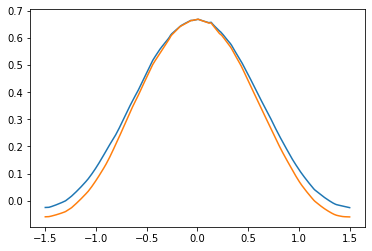

In [54]:
# 1.4 --- 84 arcmin
plt.plot(x,jns_beam[0,0,...].T[jns_beam[0,0,...].shape[-1]//2,:], label='HH x-axis')
plt.plot(x,jns_beam[1,1,...].T[jns_beam[1,1,...].shape[-1]//2,:], label='VV x-axis')

In [58]:
# jns_beam[1,1,...]

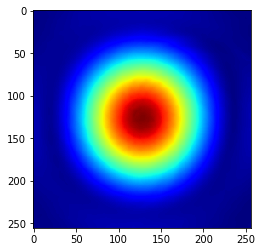

In [80]:
plt.imshow((jns_beam[1,1,...].real), cmap='jet')

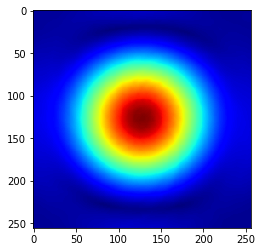

In [82]:
plt.imshow((jns_beam[0,0,...].real), cmap='jet')

In [83]:
jns_beam[0,0,...]

array([[0.02662891, 0.02649941, 0.02636471, ..., 0.02341538, 0.0234969 ,
        0.02361946],
       [0.02639864, 0.02628006, 0.02615506, ..., 0.02365516, 0.02371584,
        0.02378822],
       [0.02620709, 0.02610054, 0.02598837, ..., 0.02387457, 0.02391147,
        0.02394659],
       ...,
       [0.02455982, 0.02462135, 0.02455785, ..., 0.01752891, 0.01800646,
        0.01848835],
       [0.02469589, 0.02482982, 0.02493611, ..., 0.0179324 , 0.01834096,
        0.01877689],
       [0.02477696, 0.02491412, 0.02502961, ..., 0.01839121, 0.01872413,
        0.01910864]])

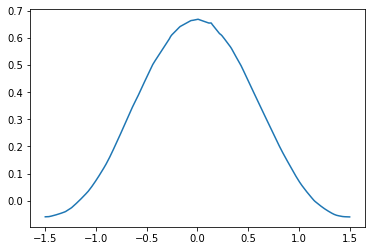

In [52]:
plt.plot(x,jns_beam[1,1,...].T[jns_beam[1,1,...].shape[-1]//2,:], label='HH x-axis')

In [48]:
jns_beam[0,0,...].shape[-1]//2

128

### Compute the mean structural similarity index between two images.

In [8]:
from skimage.measure import compare_ssim as ssim

In [9]:
beams.shape

(2, 2, 256, 256)

In [10]:
mod.shape

(2, 2, 256, 256)

In [11]:
mod[0,0]

array([[0.01007834+0.02206752j, 0.00980418+0.02206767j,
        0.00953681+0.02206639j, ..., 0.01149268+0.02010659j,
        0.01170947+0.0201015j , 0.01190076+0.02010528j],
       [0.00952835+0.02226072j, 0.00924945+0.02226189j,
        0.00897831+0.02226141j, ..., 0.01088432+0.02034459j,
        0.01111111+0.02033455j, 0.01132535+0.02032814j],
       [0.00895784+0.02245829j, 0.00867426+0.02246046j,
        0.00839759+0.02246115j, ..., 0.01028453+0.02057739j,
        0.01051797+0.02056326j, 0.01074423+0.0205501j ],
       ...,
       [0.01305408+0.01897299j, 0.01287209+0.0190056j ,
        0.01262276+0.01905481j, ..., 0.01135161+0.01467112j,
        0.01141877+0.01477407j, 0.01150506+0.01487143j],
       [0.01348937+0.01877217j, 0.01335684+0.01879145j,
        0.01321346+0.01881557j, ..., 0.0118654 +0.01453588j,
        0.01191811+0.01462187j, 0.01199013+0.01470941j],
       [0.01386408+0.0185863j , 0.01374765+0.01859945j,
        0.01363165+0.01862016j, ..., 0.01236321+0.01442446j,
 

In [21]:

X = ssim(X = beams[0,0], Y=abs(mod[0,0]), win_size=None, gradient=False, data_range=None, 
     multichannel=False, gaussian_weights=False, full=False) 

In [23]:
X

0.999815070002567

In [17]:
X[1].shape

(256, 256)

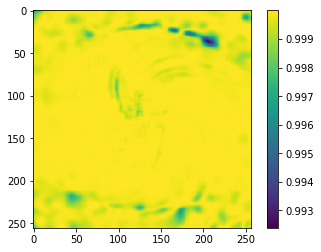

In [19]:
plt.imshow(X[1])
plt.colorbar()

In [20]:
256/3. 3

85.33333333333333

In [28]:
beams1 = np.zeros((2,2,256,256))
beams1[0,0,...] = abs(mod[0,0,...]) #xx_re[1]
beams1[0,1,...] = abs(mod[0,1,...]) #xy_re[1]
beams1[1,0,...] = abs(mod[1,1,...]) #yx_re[1]
beams1[1,1,...] = abs(mod[1,0,...])

In [26]:
psnr(img1 = beams[0,0], img2=abs(mod[0,0]))

29.954640808645408

In [30]:
for i in range(2):
    for j in range(2):
        print("%i, %i: \t" %(i,j), psnr(img1 = beams[i,j], img2=beams1[i,j]))

0, 0: 	 59.909281617290816
0, 1: 	 30.16475826986966
1, 0: 	 33.18888710533016
1, 1: 	 60.080795302583674


In [32]:
for i in range(2):
    for j in range(2):
        print("%i, %i: \t" %(i,j), 
              ssim(X = beams[i,j], Y=beams1[i,j], win_size=None, gradient=False, data_range=None, 
                   multichannel=False, gaussian_weights=False, full=False))
#               psnr(img1 = beams[i,j], img2=beams1[i,j]))

0, 0: 	 0.999815070002567
0, 1: 	 0.9988160584378368
1, 0: 	 0.9991669724937176
1, 1: 	 0.9997966761508529


In [39]:
freq = 1400e6
lamda = 3e8/freq
D = 12

fov = np.rad2deg(1.02*lamda/D)

fov

1.0436016982739995

In [ ]:
tn = 1200 + (n-1)*

In [36]:
np.linspace(1200,1950, 20)[9]

1555.2631578947369

In [42]:
y, x = np.indices((256, 256))

In [45]:
x, y

(array([[  0,   1,   2, ..., 253, 254, 255],
        [  0,   1,   2, ..., 253, 254, 255],
        [  0,   1,   2, ..., 253, 254, 255],
        ...,
        [  0,   1,   2, ..., 253, 254, 255],
        [  0,   1,   2, ..., 253, 254, 255],
        [  0,   1,   2, ..., 253, 254, 255]]),
 array([[  0,   0,   0, ...,   0,   0,   0],
        [  1,   1,   1, ...,   1,   1,   1],
        [  2,   2,   2, ...,   2,   2,   2],
        ...,
        [253, 253, 253, ..., 253, 253, 253],
        [254, 254, 254, ..., 254, 254, 254],
        [255, 255, 255, ..., 255, 255, 255]]))

In [46]:
center = np.array([(x.max()-x.min())/2.0, (y.max()-y.min())/2.0])
center

array([127.5, 127.5])

In [48]:
x.max(), x.min()

(255, 0)

In [49]:
r = np.hypot(x - center[0], y - center[1])
r

array([[180.3122292 , 179.60651436, 178.90360533, ..., 178.90360533,
        179.60651436, 180.3122292 ],
       [179.60651436, 178.89801564, 178.19231184, ..., 178.19231184,
        178.89801564, 179.60651436],
       [178.90360533, 178.19231184, 177.48380208, ..., 177.48380208,
        178.19231184, 178.90360533],
       ...,
       [178.90360533, 178.19231184, 177.48380208, ..., 177.48380208,
        178.19231184, 178.90360533],
       [179.60651436, 178.89801564, 178.19231184, ..., 178.19231184,
        178.89801564, 179.60651436],
       [180.3122292 , 179.60651436, 178.90360533, ..., 178.90360533,
        179.60651436, 180.3122292 ]])

In [50]:
r.shape

(256, 256)

In [57]:
np.where(r<=127.5)[0], len(np.where(r<=127.5)[1])

(array([  1,   1,   1, ..., 254, 254, 254]), 51040)

In [3]:
n  = [2,3]
import numpy as np
np.diag(n)

array([[2, 0],
       [0, 3]])

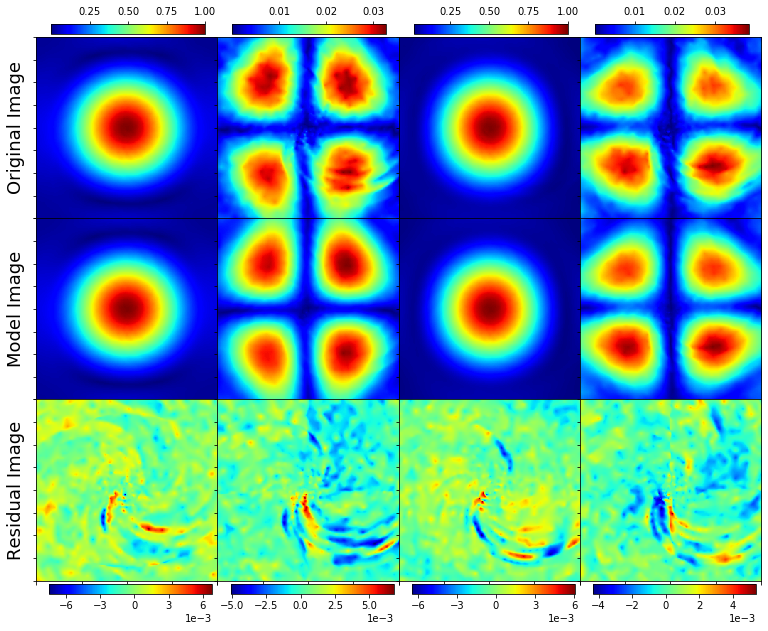

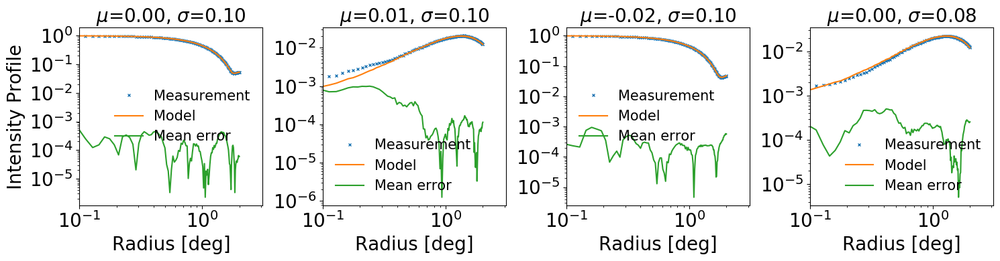

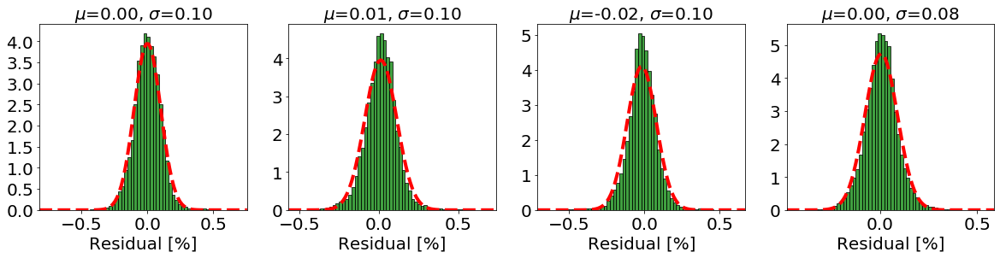

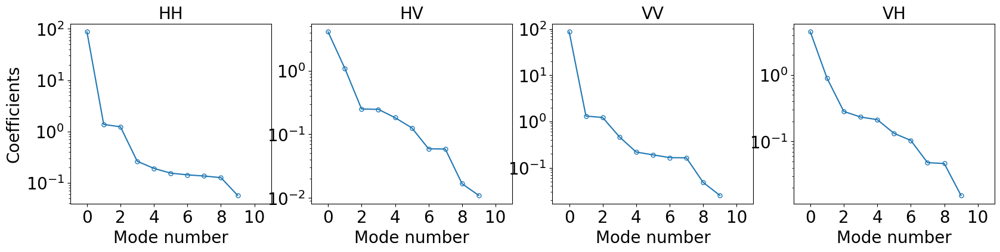

In [20]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


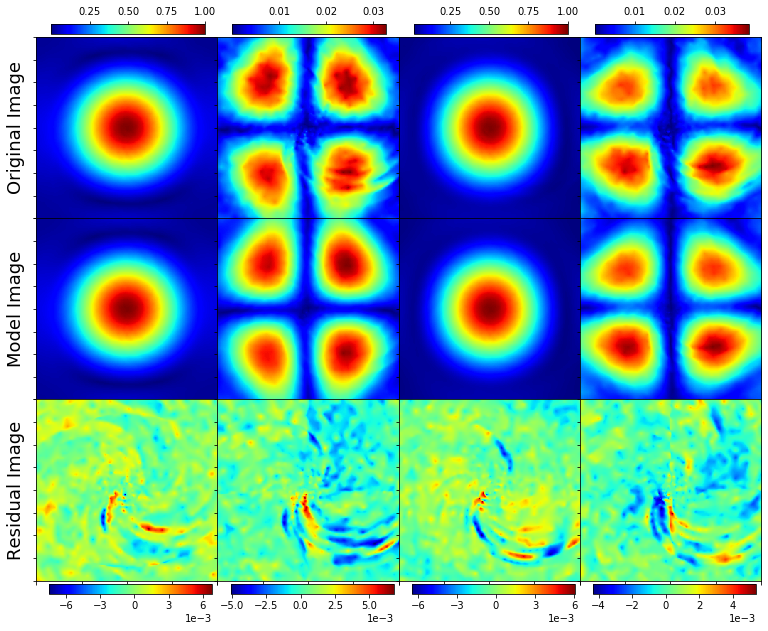

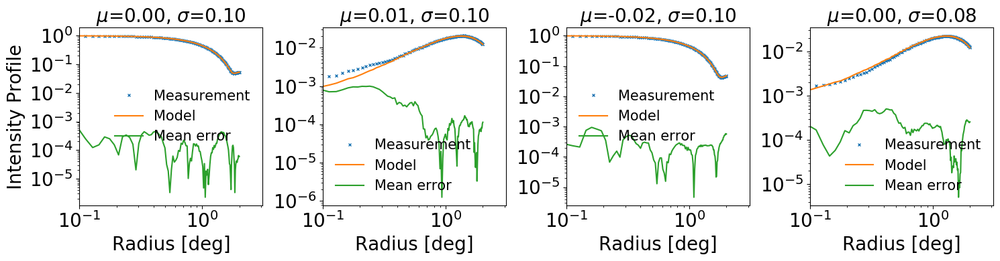

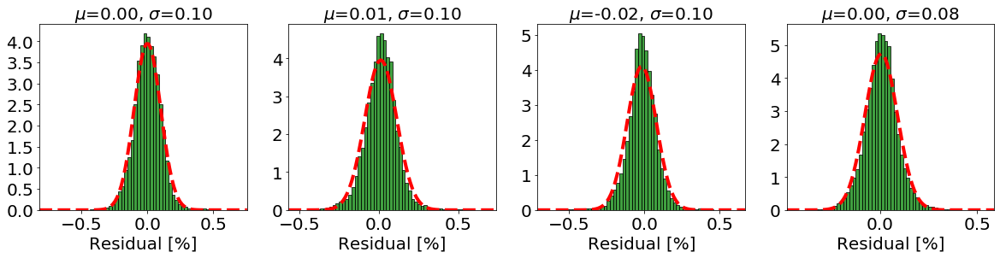

0 0
[87.48138743657098, 1.3718680144300888, 1.233248195009577, 0.26276105281825984, 0.19053350881099046, 0.15402304166089273, 0.14256601425370355, 0.13536866154586538, 0.12586036776848641, 0.05671045327664418]
0 1
[4.099143982757987, 1.0897316215966117, 0.24986608698685628, 0.2469062446603491, 0.18262726673175353, 0.12617907054309885, 0.059134544950901945, 0.058544071705527355, 0.016662022895946735, 0.010900520531241444]
1 0
[86.74462174772349, 1.3110679783225339, 1.218302114463315, 0.46505751341341417, 0.21820487201878982, 0.1898690989269682, 0.16565179359072332, 0.16357586604845759, 0.04819168864738826, 0.025211933708393558]
1 1
[4.463745531161889, 0.8936267334659261, 0.28250655679398773, 0.23295366604542211, 0.21249391295224504, 0.13220693774814746, 0.10358318584699834, 0.04790823882097365, 0.04645017468774319, 0.015383291571033957]


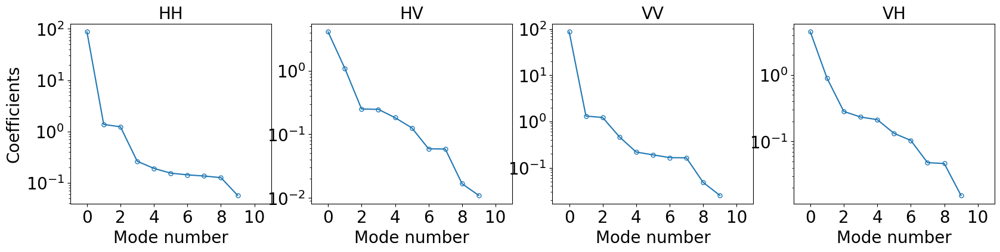

In [21]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])


In [24]:
dat.shape

(2, 2, 256, 256)

In [33]:
np.array(recons).shape

(4, 20, 2, 2, 256, 256)

In [ ]:
import sys
sys.path.insert(0, '/home/tan/Documents/GSSTI/JGSA/')

import primary_beam_denoising_pipeline as pb

mse, recons, weights = [], [], []
thresh = range(1,11)
K = pb.Singular_Value_Decompostion(gdata)
for i,ii in enumerate(thresh):
    reco, err, w = K.svdrecon(thresh=ii)
    recons.append(reco)
    mse.append(err)
    weights.append(w)

In [36]:
abs(recons[0][ch,i,j,:,:]).shape

(256, 256)

In [37]:
abs(gdata[ch,i,j,:,:]).shape

(256, 256)

In [43]:
np.array(recons).shape

(10, 20, 2, 2, 256, 256)

In [ ]:
abs(recons[egn][ch,i,j,:,:])

0 0
0
1
2
3
4
5
6
7
8
9
[0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861]
0 1
0
1
2
3
4
5
6
7
8
9
[0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05, 5.809704461668429e-05]
1 0
0
1
2
3
4
5
6
7
8
9
[0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 0.0001238112066554861, 5.809

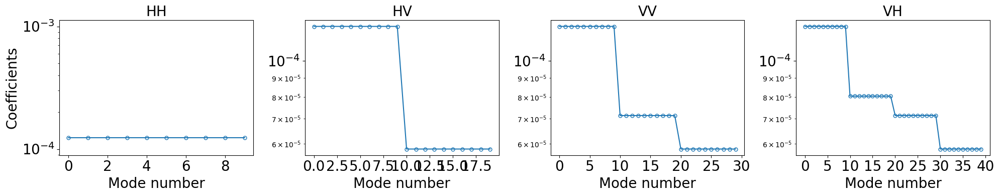

In [52]:
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

fig, ax = plt.subplots(1,4, figsize=(20,4), dpi=100)
c=0
ch = 10
egn =9
ap = []

for i in range(2):
    for j in range(2):   
        print(i,j) 
        for k in range(egn+1):
    #         print(sorted(coeffs[i,j,:], reverse=True)) 
            
            dt= abs(gdata[ch,i,j,:,:])
            print(k)
            md = abs(np.array(recons)[egn][ch,i,j,:,:])
#             print(k)
#             print('h')
            ap.append(rmse(predictions=md, targets=dt))
        print(ap)
        # ax[c].semilogy(range(coeffs.shape[-1]), coeffs[i,j,:], 'o-', mfc='None', markersize=5) #'o-', mfc='None',
        ax[c].semilogy(range(len(np.array(ap)) ), sorted(ap, reverse=True), 'o-', mfc='None', markersize=5)
        # ax[c].plot(range(coeffs.shape[-1]), sorted(coeffs[i,j,:], reverse=True), 'o-', mfc='None', markersize=5)
#         ax[c].set_xlim([-1,coeffs.shape[-1]+1])
        ax[c].set_xlabel('Mode number', fontsize=20) 
        if i == 0 and j == 0: 
            ax[c].set_ylabel('Coefficients', fontsize=20)
            ax[c].set_title(r'HH', fontsize=20) 
        if i == 0 and j == 1: 
            ax[c].set_title(r'HV', fontsize=20)
        if i == 1 and j == 0: 
            ax[c].set_title(r'VV', fontsize=20) 
        if i == 1 and j == 1: 
            ax[c].set_title(r'VH', fontsize=20)
#                ax[c].set_ylabel('Coefficients', fontsize=20)
        for tick in ax[c].xaxis.get_major_ticks(): tick.label.set_fontsize(20) 
        for tick in ax[c].yaxis.get_major_ticks(): tick.label.set_fontsize(20)
        c+=1
# if view==True: plt.show()
fig.tight_layout()
# plt.close()

In [50]:
np.array(ap).shape

(9,)

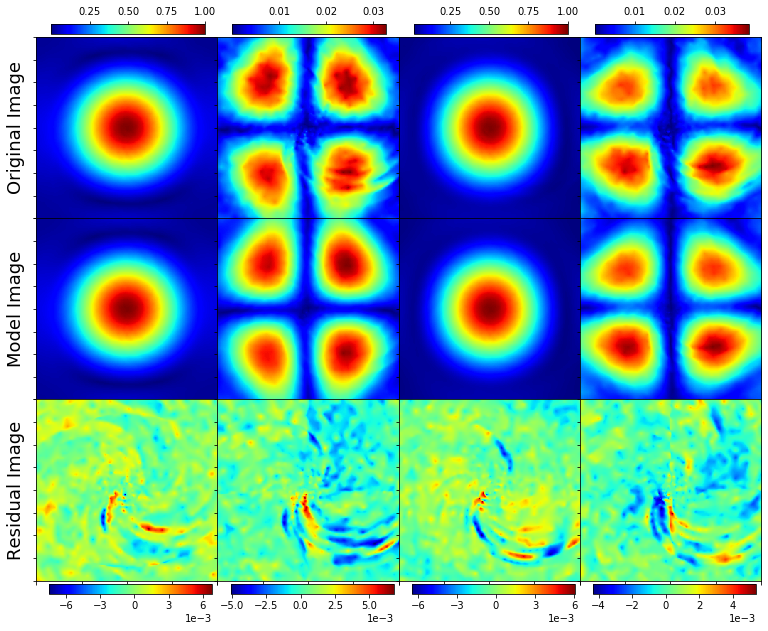

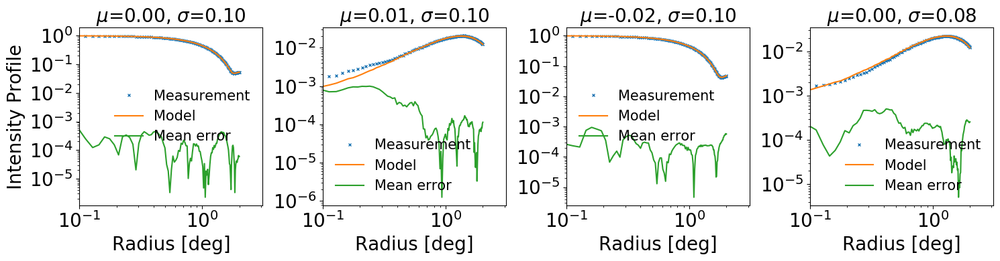

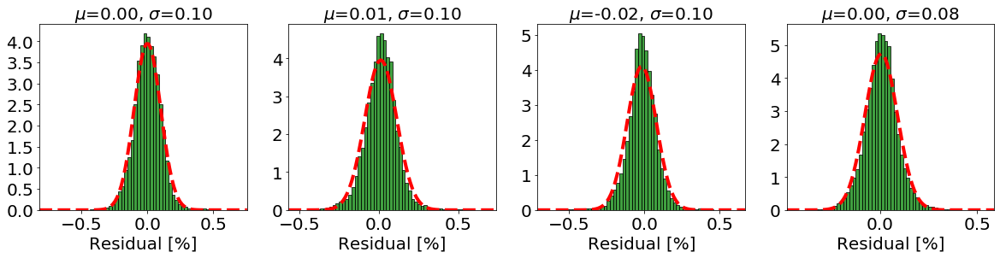

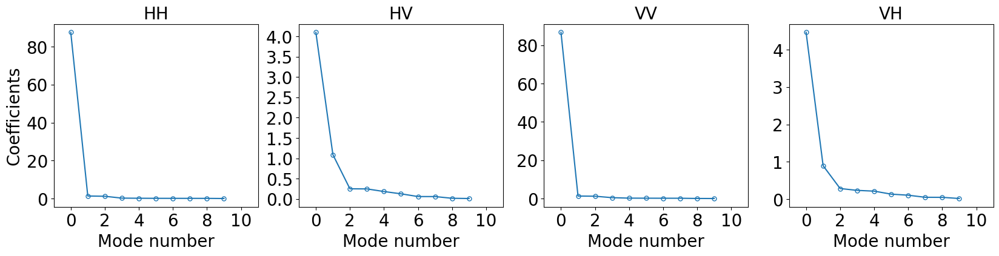

In [18]:
## Using 1 eigenvalue
ch = 10
egn =3
dat, mod = gdata[ch,:,:,:,:], recons[egn][ch,:,:,:,:]
coeffs = weights[0][:,:,:,:10]
# gof_plot(abs(dat), abs(mod), abs(coeffs[:,:,ch,:]), vrange=[-25,0, -30,-10], extent = [-1,1,-1,1])
from gof import *
gof_plot2(abs(np.nan_to_num(dat)), abs(mod), abs(coeffs[:,:,ch,:]), extent = [-1,1,-1,1])
